# Visual Odometry

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def triangulate(q, P):  # Credits to Julliete
    """
    Return the traingulation.

    Parameters
    ----------
    q: 3 x n numpy array
        Homogenous pixel coordinates q1... qn
        One for each camera seeing the point.
        At least two.
    P: list of 3 x 4 numpy arrays
        Projection matrices P1... Pn
        For each pixel coordinate

    Return
    ------
    Q: 3 x 1 numpy array
        Triangulation of the point using the linear SVD algorithm
    """
    _, n = q.shape  # n = no. cameras has seen pixel.

    # Prepare B matrix. Two rows for each camera n.
    B = np.zeros((2 * n, 4))
    for i in range(n):
        B[2 * i: 2 * i + 2] = [
            P[i][2, :] * q[0, i] - P[i][0, :],
            P[i][2, :] * q[1, i] - P[i][1, :],
        ]
    # BQ = 0. Minimize using Svd.
    _, _, vh = np.linalg.svd(B)
    Q = vh[-1, :]  # Q is ev. corresponding to the min. singular point.
    return Q[:3].reshape(3, 1) / Q[3]  # Reshape and scale

### Load images and camera matrix

In [6]:
# camera matrix
K = np.loadtxt('Glyp/K.txt')

# images
im = []
for i in range(20):
    image = cv2.imread("Glyp/sequence/0000{:02d}.png".format(i+1))[:, :, ::-1]
    im.append(image)

### 1. SIFT matches

In [7]:
im0, im1, im2 = im[0], im[1], im[2]
n_im = len(im)

### Compute all the matches

In [8]:
sift = cv2.SIFT_create(nfeatures=2000)
kps, des = [], []
for i in range(3):
    kp_i, d = sift.detectAndCompute(im[i], None)
    kps.append(np.array([k.pt for k in kp_i]))
    des.append(d)

bf = cv2.BFMatcher(crossCheck=True)
matches = []
for i in range(2):
    matches_i = bf.match(des[i], des[i + 1])
    matches_i = np.array([(m.queryIdx, m.trainIdx) for m in matches_i])
    matches.append(matches_i)

### 2. Essential matrix with RANSAC and relative pose

We can estimate $\textbf{F}$ or $\textbf{E}$ with RANSAC.

\begin{align*}
	\textbf{E} &= \textbf{R}[\textbf{t}]_\times\\
	0 = \textbf{E}(s\textbf{t}) &= \textbf{R}[\textbf{t}]_\times (s\textbf{t})
\end{align*}

$\textbf{E}$ has 3 degrees of freedom: 3 from the rotation, 2 from the scale invariant translation. Each pair of points fixes 1 degrees of freedom so we need 5 pairs of points.

In [9]:
# def get_pos_from_matches(kps, matches, i):
#     p0 = kps[i    ][matches[i][:, 0]]
#     p1 = kps[i + 1][matches[i][:, 1]]
    
#     E, mask = cv2.findEssentialMat(
#         p0,
#         p1,
#         cameraMatrix=K,
#         method=cv2.RANSAC
#     )
#     _, R, t, _ = cv2.recoverPose(Es[i], points_i, points_ip1, K)
#     inlier = np.argwhere(mask.flatten())

In [10]:
Es = []
Rs = []
ts = []
for i in range(2):
    points_i   = kps[i    ][matches[i][:, 0]]
    points_ip1 = kps[i + 1][matches[i][:, 1]]

    E_i, mask = cv2.findEssentialMat(
        points_i,
        points_ip1,
        cameraMatrix=K,
        method=cv2.RANSAC
    )
    Es.append(E_i)
    _, R, t, _ = cv2.recoverPose(Es[i], points_i, points_ip1, K)
    inlier = np.argwhere(mask.flatten())
    Rs.append(R)
    ts.append(t)
    matches[i] = matches[i][inlier.flatten()].reshape((-1, 2))

R1 = Rs[0]
t1 = ts[0]

In [11]:
# E01, mask = cv2.findEssentialMat(
#     points_i,
#     points_ip1,
#     cameraMatrix=K,
#     method=cv2.RANSAC
# )
# _, R1, t1, _ = cv2.recoverPose(E01, points_i, points_ip1, K)

### 3. Subset of features in 3 consecutive images

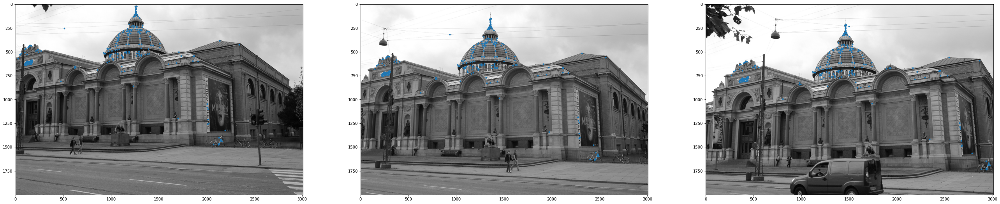

In [12]:
_, idx01, idx12 = np.intersect1d(matches[0][:,1], matches[1][:,0], return_indices=True)

points = []
points.append(kps[0][matches[0][idx01, 0]])
points.append(kps[1][matches[1][idx12, 0]])
points.append(kps[2][matches[1][idx12, 1]])

fig, ax = plt.subplots(1,3, figsize=(45, 20))
for i in range(3):
    ax[i].imshow(im[i])
    ax[i].plot(points[i][:, 0], points[i][:, 1], '.')
plt.savefig('ex11_plot1.jpg', bbox_inches='tight',dpi=500)

### 4. Triangulation and pose estimation

We know that we can find the pose of two cameras relative to each other. Given a third image and camera:

   - fix the scale with the first 2 camera
   - get the 3D points
   - Use them to get the pose of the 3rd camera (perspective n points)
   
#### Perspective-$n$-point problem:
Estimate the pose of a calibrated camera from $n$ corresponding 3D-2D correspondences.

Naïvely, we could estimate the projection matrix of the camera and get:
$\begin{bmatrix}\textbf{R} & \textbf{t} \end{bmatrix} = \textbf{K}^{-1}
\tilde{\textbf{P}}$, but is has more degrees of freedom and requires more points.

This uses more point and it's less precise (more degrees of freedom). We have 6 degrees of freedom (3 rotation, 3 translation as scale matters (fixed)). Each pair of point fixes 2 degrees, we need 3 points.

The three 2D points give 3 pairwise angle, the three 3D points give 3 pairwise distances. This give 4 possible solutions and we need a 4th point to decide which to take.

Once we get the pose of the camera, we can get its position:
\begin{align*}
	\textbf{T}_{world-cam} =  \begin{bmatrix}
		\textbf{R} & \textbf{t}\\
		\textbf{0} & 1
	\end{bmatrix}\\
	\textbf{T}_{cam-world} = \begin{bmatrix}
		\textbf{R}^T & -\textbf{R}^T\textbf{t}\\
		\textbf{0} & 1
	\end{bmatrix}
\end{align*}

In [13]:
# Assume that camera 0 is at position 0
# Use the decomposition of essential matrix 01 to find the pose of
# camera 2
# You know K so you can get the projection matrix
# You can now use triangulate

In [14]:
R0 = np.eye(3)
t0 = np.array([[0, 0, 0]]).T
T0 = np.vstack((np.hstack([R0, t0])))
T1 = np.vstack((np.hstack([R1, t1])))
P0 = K @ T0
P1 = K @ T1
Qs = []
for i in range(len(points[0])):
    Qs.append(triangulate(np.array([points[0][i], points[1][i]]), [P0, P1]))

In [15]:
def filter_points(Q, tx=100, ty=100, tz=100):
    Q = Q[np.abs(Q[:, 0]) < tx]
    Q = Q[np.abs(Q[:, 1]) < ty]
    Q = Q[np.abs(Q[:, 2]) < tz]
    return Q

In [16]:
Qs = filter_points(np.array(Qs).reshape(-1, 3))

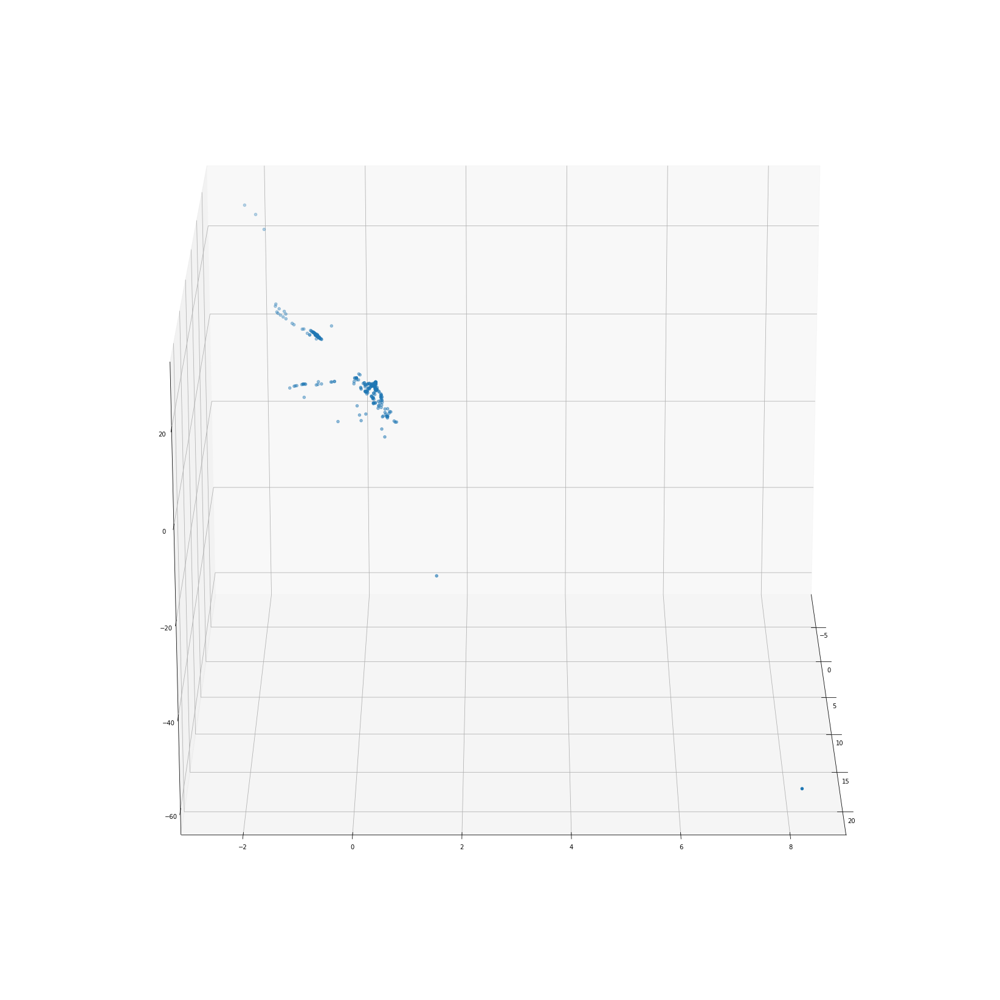

In [17]:
fig = plt.figure(figsize=(30, 30))
ax = fig.add_subplot(projection="3d")
Qs = Qs[Qs[:, 2] > -100]
ax.scatter(Qs[:, 0], Qs[:, 1], Qs[:, 2], '.');
ax.view_init(20, 0)
plt.savefig('ex11_plot2.jpg', bbox_inches='tight',dpi=500)

### 5. All images

In [18]:
sift = cv2.SIFT_create(nfeatures=2000)
kps, des = [], []
for i in range(20):
    kp_i, d = sift.detectAndCompute(im[i], None)
    kps.append(np.array([k.pt for k in kp_i]))
    des.append(d)

frame 0
frame 1
frame 2
frame 3
frame 4
frame 5
frame 6
frame 7
frame 8
frame 9
frame 10
frame 11
frame 12
frame 13
frame 14
frame 15


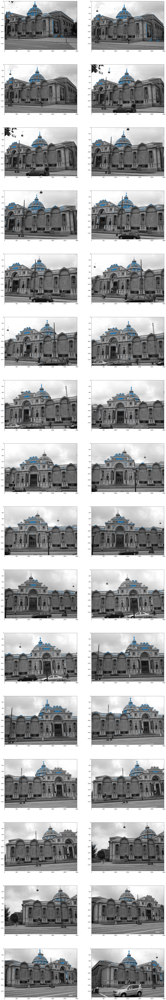

In [19]:
T1 = np.hstack((R0, t0))

N=17
fig, ax = plt.subplots(N - 1, 2, figsize=(25, (N - 1) * 10))

final_points=[]
for i in range (N-1):
    T0 = T1
    print('frame',i)
    j=i+1
    img_current_frame = im[i]
    img_next_frame = im[j]

    sift = cv2.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = kps[i], des[i]
    kp2, des2 = kps[j], des[j]

    bf=cv2.BFMatcher()
    matches_=bf.match(des1,des2)
    U = np.array([kp1[m.queryIdx] for m in matches_])
    V = np.array([kp2[m.trainIdx] for m in matches_])

    E, mask = cv2.findEssentialMat(U, V, K, method=cv2.RANSAC, threshold=0.5)
    mask = np.argwhere(mask.flatten()).flatten()
    _, cur_R, cur_t, _ = cv2.recoverPose(E, U, V, K)
    if np.linalg.det(cur_R)<0:
        cur_R = -cur_R
        cur_t = -cur_t
    T1 = np.hstack((cur_R, cur_t))    
    
    # Triangulation
    P0 = K @ T0
    P1 = K @ T1  
    Q = cv2.triangulatePoints(P0, P1, U[mask].T, V[mask].T)
    Q = Q[:-1] / Q[-1]
    
    ax[i][0].imshow(im[i])
    ax[i][1].imshow(im[j])
    ax[i][0].plot(U[mask, 0], U[mask, 1], '.')
    ax[i][1].plot(V[mask, 0], V[mask, 1], '.')
    
    final_points.append(Q)

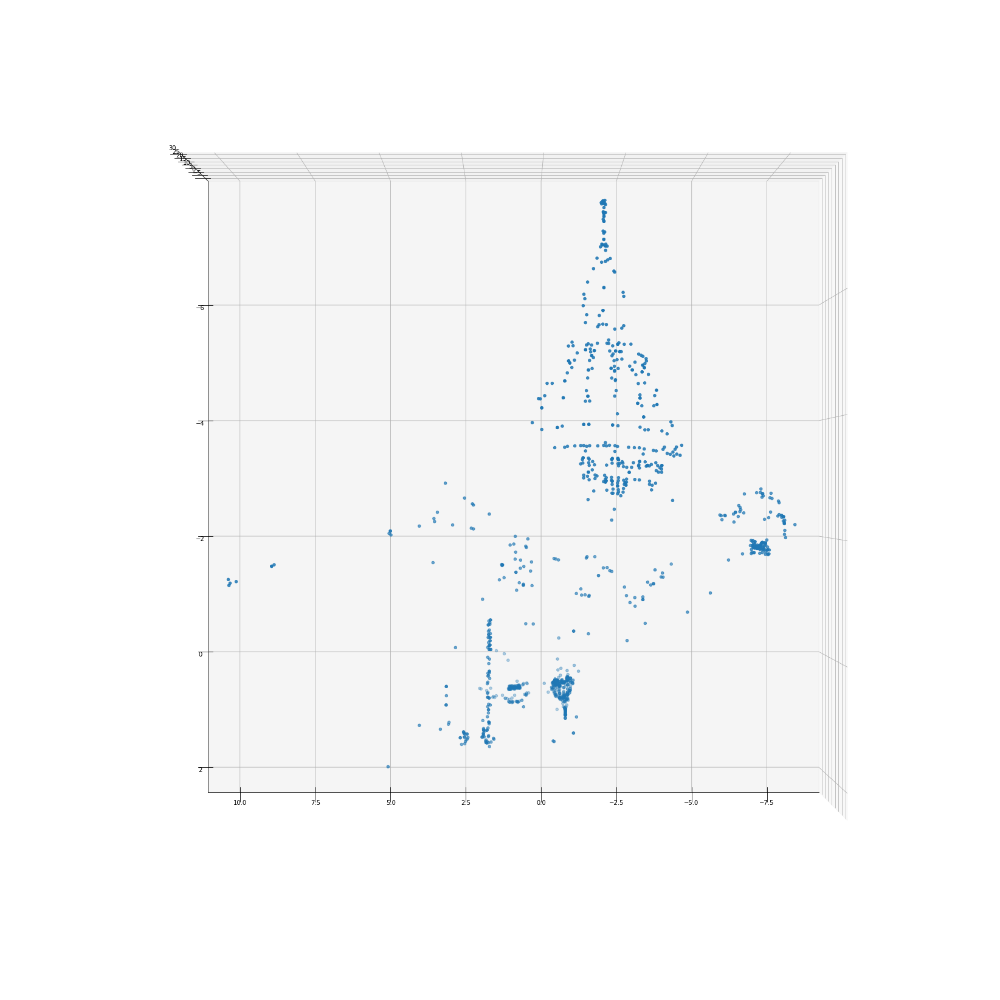

In [20]:
Q = np.hstack(final_points[:2]).T
Q = filter_points(Q, 10, 10, 30)

fig = plt.figure(figsize=(30, 30))
ax = fig.add_subplot(projection="3d")
ax.scatter(Q[:, 0], Q[:, 1], Q[:, 2]);
ax.view_init(90, 90);
plt.savefig('ex11_plot3.jpg', bbox_inches='tight',dpi=500)

In [21]:
import open3d as o3d

pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(Q)
o3d.visualization.draw_geometries([pcd])

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
[Open3D WARNING] GLFW Error: WGL: Failed to make context current: The handle is invalid. 
